# Выпускная квалификационная работа по курсу «Data Science»

In [1]:
import pandas as pd
import numpy as np
import copy
import seaborn as sns
import matplotlib.pyplot as plt
import stemgraphic
from scipy import stats
from sklearn import preprocessing
from scipy.stats import boxcox, shapiro
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from scipy.stats import ttest_ind
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.decomposition import PCA
from factor_analyzer import FactorAnalyzer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import SplineTransformer
from sklearn.neural_network import MLPRegressor
import pickle
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import GridSearchCV
from sklearn.base import BaseEstimator
from sklearn.dummy import DummyRegressor
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn import metrics
from sklearn.metrics import mean_absolute_error
print(tf.__version__)

2.8.0


### Загружаем данные из файлов и формируем два датафрейма

In [2]:
df_Xbp = pd.read_excel('dataset/X_bp.xlsx', index_col=0)
df_Xnup = pd.read_excel('dataset/X_nup.xlsx', index_col=0)


In [3]:
pd.DataFrame(df_Xnup.columns, columns=['характиристики нашивок'])

,характиристики нашивок
0,"Угол нашивки, град"
1,Шаг нашивки
2,Плотность нашивки


In [4]:
pd.DataFrame(df_Xbp.columns, columns=['характиристики базальтопластика'])

,характиристики базальтопластика
0,Соотношение матрица-наполнитель
1,"Плотность, кг/м3"
2,"модуль упругости, ГПа"
3,"Количество отвердителя, м.%"
4,"Содержание эпоксидных групп,%_2"
5,"Температура вспышки, С_2"
6,"Поверхностная плотность, г/м2"
7,"Модуль упругости при растяжении, ГПа"
8,"Прочность при растяжении, МПа"
9,"Потребление смолы, г/м2"


In [5]:
df_Xbp.shape

(1023, 10)

In [6]:
df_Xnup.shape

(1040, 3)

In [7]:
df_Xbp.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2"
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0


In [8]:
df_Xnup.head()

,"Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,0.0,4.0,57.0
1.0,0.0,4.0,60.0
2.0,0.0,4.0,70.0
3.0,0.0,5.0,47.0
4.0,0.0,5.0,57.0


### Объединяем две таблицы по индексу, тип объединения INNER.

In [9]:
df_join = df_Xbp.join(df_Xnup, how='inner')


In [10]:
df_join.shape

(1023, 13)

In [11]:
df_join.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,1.857143,2030.0,738.736842,30.00,22.267857,100.000000,210.0,70.0,3000.0,220.0,0.0,4.0,57.0
1.0,1.857143,2030.0,738.736842,50.00,23.750000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,60.0
2.0,1.857143,2030.0,738.736842,49.90,33.000000,284.615385,210.0,70.0,3000.0,220.0,0.0,4.0,70.0
3.0,1.857143,2030.0,738.736842,129.00,21.250000,300.000000,210.0,70.0,3000.0,220.0,0.0,5.0,47.0
4.0,2.771331,2030.0,753.000000,111.86,22.267857,284.615385,210.0,70.0,3000.0,220.0,0.0,5.0,57.0


In [12]:
pd.DataFrame(df_join.columns, columns=['характиристики композиционных материалов в df_join'])

,характиристики композиционных материалов в df_join
0,Соотношение матрица-наполнитель
1,"Плотность, кг/м3"
2,"модуль упругости, ГПа"
3,"Количество отвердителя, м.%"
4,"Содержание эпоксидных групп,%_2"
5,"Температура вспышки, С_2"
6,"Поверхностная плотность, г/м2"
7,"Модуль упругости при растяжении, ГПа"
8,"Прочность при растяжении, МПа"
9,"Потребление смолы, г/м2"


## Пропуски в данных отсутствуют

In [13]:
df_join.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 1023 entries, 0.0 to 1022.0
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       1023 non-null   float64
 1   Плотность, кг/м3                      1023 non-null   float64
 2   модуль упругости, ГПа                 1023 non-null   float64
 3   Количество отвердителя, м.%           1023 non-null   float64
 4   Содержание эпоксидных групп,%_2       1023 non-null   float64
 5   Температура вспышки, С_2              1023 non-null   float64
 6   Поверхностная плотность, г/м2         1023 non-null   float64
 7   Модуль упругости при растяжении, ГПа  1023 non-null   float64
 8   Прочность при растяжении, МПа         1023 non-null   float64
 9   Потребление смолы, г/м2               1023 non-null   float64
 10  Угол нашивки, град                    1023 non-null   float64
 11  Шаг нашивки

## Описательная статистика характеристик композиционных материалов

In [14]:
df_join.describe().T

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,1023.0,2.930366,0.913222,0.389403,2.317887,2.906878,3.552660,5.591742
"Плотность, кг/м3",1023.0,1975.734888,73.729231,1731.764635,1924.155467,1977.621657,2021.374375,2207.773481
"модуль упругости, ГПа",1023.0,739.923233,330.231581,2.436909,500.047452,739.664328,961.812526,1911.536477
"Количество отвердителя, м.%",1023.0,110.570769,28.295911,17.740275,92.443497,110.564840,129.730366,198.953207
"Содержание эпоксидных групп,%_2",1023.0,22.244390,2.406301,14.254985,20.608034,22.230744,23.961934,33.000000
"Температура вспышки, С_2",1023.0,285.882151,40.943260,100.000000,259.066528,285.896812,313.002106,413.273418
"Поверхностная плотность, г/м2",1023.0,482.731833,281.314690,0.603740,266.816645,451.864365,693.225017,1399.542362
"Модуль упругости при растяжении, ГПа",1023.0,73.328571,3.118983,64.054061,71.245018,73.268805,75.356612,82.682051
"Прочность при растяжении, МПа",1023.0,2466.922843,485.628006,1036.856605,2135.850448,2459.524526,2767.193119,3848.436732
"Потребление смолы, г/м2",1023.0,218.423144,59.735931,33.803026,179.627520,219.198882,257.481724,414.590628


## Количество уникальных значений

In [15]:
df_join.nunique()

Соотношение матрица-наполнитель         1014
Плотность, кг/м3                        1013
модуль упругости, ГПа                   1020
Количество отвердителя, м.%             1005
Содержание эпоксидных групп,%_2         1004
Температура вспышки, С_2                1003
Поверхностная плотность, г/м2           1004
Модуль упругости при растяжении, ГПа    1004
Прочность при растяжении, МПа           1004
Потребление смолы, г/м2                 1003
Угол нашивки, град                         2
Шаг нашивки                              989
Плотность нашивки                        988
dtype: int64

In [16]:
df_join.duplicated().sum()

0

In [17]:
df_join.isna()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0.0,False,False,False,False,False,False,False,False,False,False,False,False,False
1.0,False,False,False,False,False,False,False,False,False,False,False,False,False
2.0,False,False,False,False,False,False,False,False,False,False,False,False,False
3.0,False,False,False,False,False,False,False,False,False,False,False,False,False
4.0,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,False,False,False,False,False,False,False,False,False,False,False,False,False
1019.0,False,False,False,False,False,False,False,False,False,False,False,False,False
1020.0,False,False,False,False,False,False,False,False,False,False,False,False,False
1021.0,False,False,False,False,False,False,False,False,False,False,False,False,False


In [18]:
df_join.isna().sum()

Соотношение матрица-наполнитель         0
Плотность, кг/м3                        0
модуль упругости, ГПа                   0
Количество отвердителя, м.%             0
Содержание эпоксидных групп,%_2         0
Температура вспышки, С_2                0
Поверхностная плотность, г/м2           0
Модуль упругости при растяжении, ГПа    0
Прочность при растяжении, МПа           0
Потребление смолы, г/м2                 0
Угол нашивки, град                      0
Шаг нашивки                             0
Плотность нашивки                       0
dtype: int64

## "Угол нашивки" закодируем с помощью LabelEncoder

In [19]:
le = LabelEncoder()
df_join['Угол нашивки, град'] = le.fit_transform(df_join['Угол нашивки, град'])


## Гистограммы

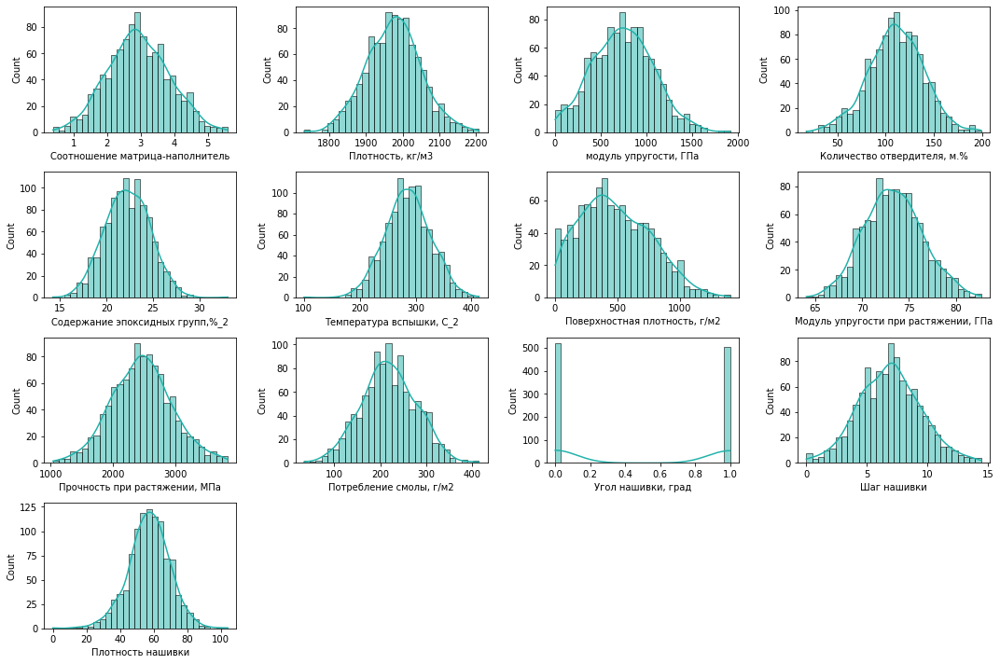

In [20]:
def histodraw(df_join, variables, n_rows, n_cols):
    fig=plt.figure(figsize=(15, 10))
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        sns.histplot(data=df_join, x=var_name, kde=True, bins=30, color = 'lightseagreen')
    fig.tight_layout()
    plt.show()

histodraw(df_join, df_join.columns, 4, 4)

 ## Попарные графики рассеяния

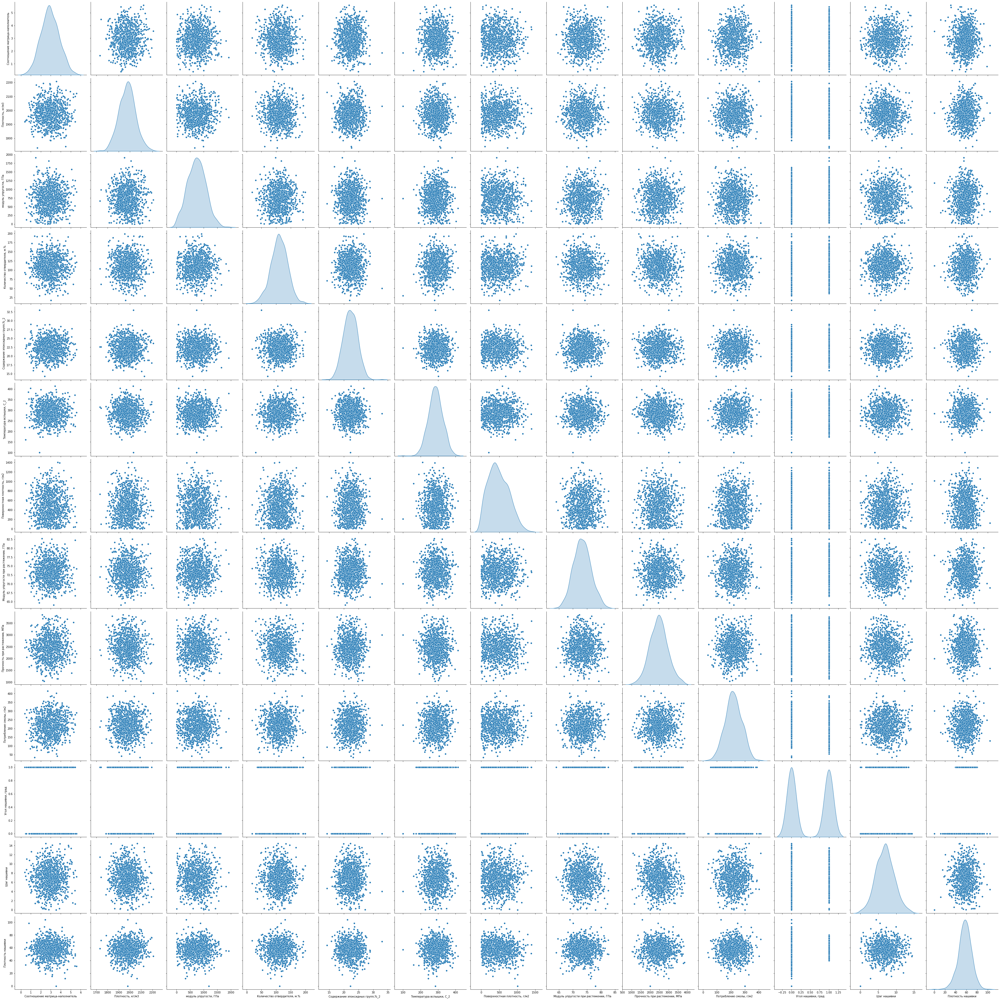

In [21]:
sns.pairplot(df_join, height=4, diag_kind='kde');

## Диаграммы "ящик с усами" до удаления выбросов

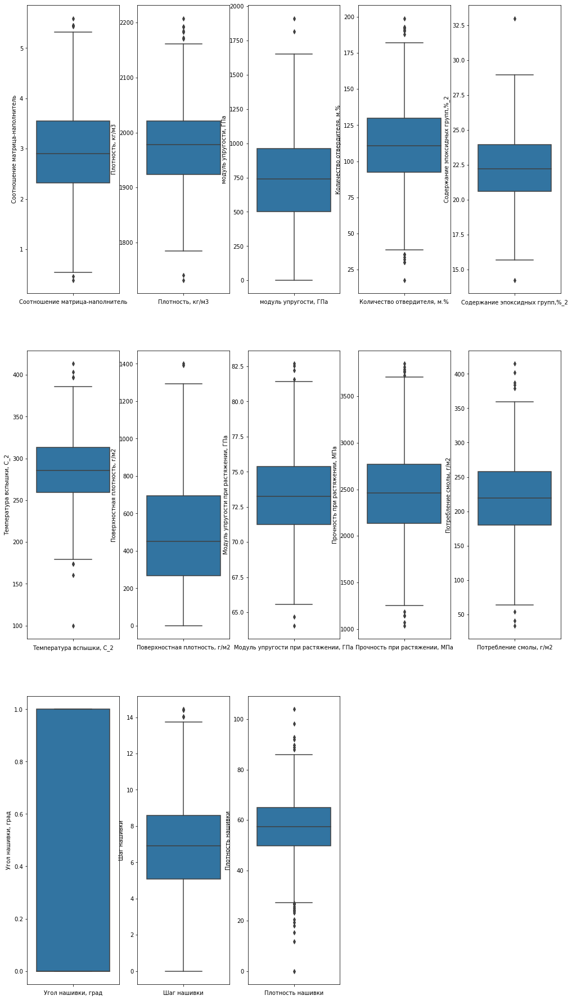

In [22]:
n = 1  # начальное значение счетчика
s = 3  # строк
c = 5  # столбцов


fig = plt.figure(figsize=(17, 32))

for i in df_join.columns:
    plt.subplot(s, c, n)
    plt.xlabel(i)
    sns.boxplot(y = df_join[i])
    n = n + 1
   
plt.show()

##  Визуализация данных с помощью корреляционной матрицы до удаления выбросов

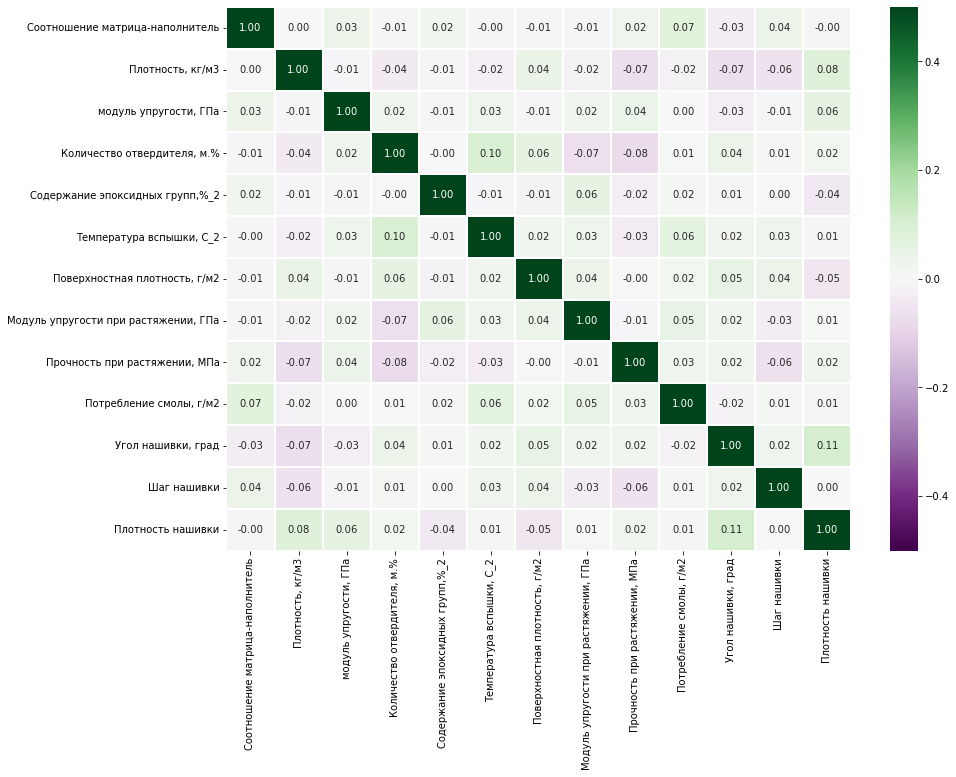

In [23]:
cor_map = df_join.corr()
fig, ax = plt.subplots(figsize=(14, 10))
sns.heatmap(cor_map, vmin=-0.5, vmax=0.5, annot=True, fmt='.2f',cmap='PRGn', ax=ax, linewidths = 0.1)
plt.show()

## Корреляции между переменными на тепловой карте визуально не выявлена

# Предобработка данных

## Удаление выбросов

### Сравним два метода удаления выбросов: 3-х сигм или межквартильных расстояний

In [24]:
sigm = 0
iqd= 0
for column in df_join:
    d = df_join.loc[:, [column]]
    # методом 3-х сигм
    zscore = (df_join[column] - df_join[column].mean()) / df_join[column].std()
    d['3s'] = zscore.abs() > 3
    sigm += d['3s'].sum()
    # методом межквартильных расстояний
    q1 = np.quantile(df_join[column], 0.25)
    q3 = np.quantile(df_join[column], 0.75)
    iqr = q3 - q1
    lower = q1 - 1.5 * iqr
    upper = q3 + 1.5 * iqr
    d['iq'] = (df_join[column] <= lower) | (df_join[column] >= upper)
    iqd+= d['iq'].sum()
print( sigm,'-- Выброса методом 3-х сигм',)
print( iqd,'-- Выброса методом  межквартильных расстояний, выбросов',)



24 -- Выброса методом 3-х сигм
93 -- Выброса методом  межквартильных расстояний, выбросов


### Покажем распределение выбросов по характеристикам

In [25]:
temp_df = df_join.copy()
for i in df_join.columns:
    temp_df[i] = abs((df_join[i] - df_join[i].mean()) / df_join[i].std())
    print(f"{sum(temp_df[i] > 3)} выбросов в признаке {i}")
print(f' Всего {sum(sum(temp_df.values > 3))} выброса')

0 выбросов в признаке Соотношение матрица-наполнитель
3 выбросов в признаке Плотность, кг/м3
2 выбросов в признаке модуль упругости, ГПа
2 выбросов в признаке Количество отвердителя, м.%
2 выбросов в признаке Содержание эпоксидных групп,%_2
3 выбросов в признаке Температура вспышки, С_2
2 выбросов в признаке Поверхностная плотность, г/м2
0 выбросов в признаке Модуль упругости при растяжении, ГПа
0 выбросов в признаке Прочность при растяжении, МПа
3 выбросов в признаке Потребление смолы, г/м2
0 выбросов в признаке Угол нашивки, град
0 выбросов в признаке Шаг нашивки
7 выбросов в признаке Плотность нашивки
 Всего 24 выброса


In [26]:
df_join_clean = df_join[(np.abs(stats.zscore(df_join)) <= 3).all(axis=1)]
df_join_clean

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
1.0,1.857143,2030.000000,738.736842,50.000000,23.750000,284.615385,210.000000,70.000000,3000.000000,220.000000,0,4.000000,60.000000
3.0,1.857143,2030.000000,738.736842,129.000000,21.250000,300.000000,210.000000,70.000000,3000.000000,220.000000,0,5.000000,47.000000
4.0,2.771331,2030.000000,753.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,57.000000
5.0,2.767918,2000.000000,748.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,60.000000
6.0,2.569620,1910.000000,807.000000,111.860000,22.267857,284.615385,210.000000,70.000000,3000.000000,220.000000,0,5.000000,70.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1018.0,2.271346,1952.087902,912.855545,86.992183,20.123249,324.774576,209.198700,73.090961,2387.292495,125.007669,1,9.076380,47.019770
1019.0,3.444022,2050.089171,444.732634,145.981978,19.599769,254.215401,350.660830,72.920827,2360.392784,117.730099,1,10.565614,53.750790
1020.0,3.280604,1972.372865,416.836524,110.533477,23.957502,248.423047,740.142791,74.734344,2662.906040,236.606764,1,4.161154,67.629684
1021.0,3.705351,2066.799773,741.475517,141.397963,19.246945,275.779840,641.468152,74.042708,2071.715856,197.126067,1,6.313201,58.261074


## Диаграммы "ящик с усами" после удаления выбросов

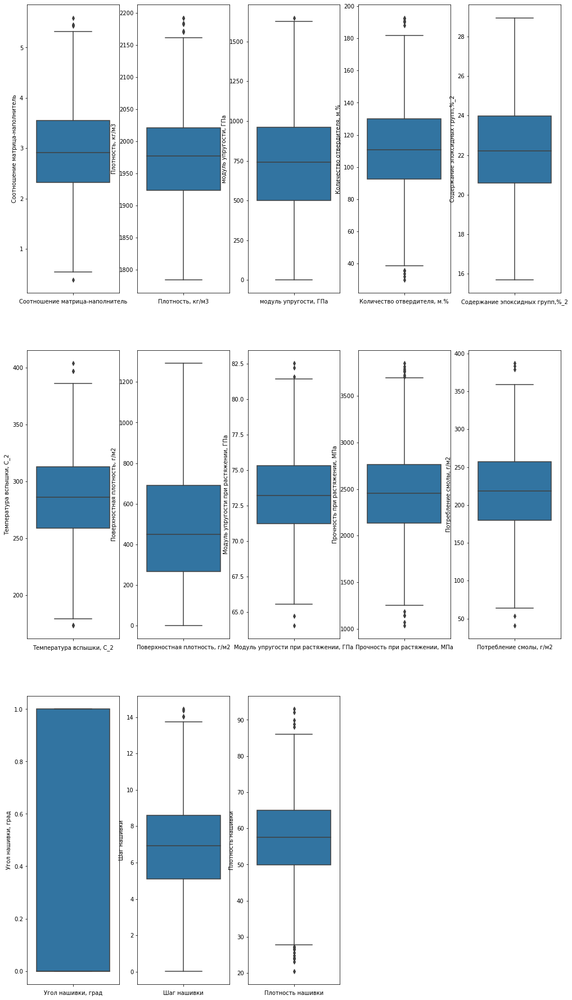

In [27]:
n = 1  # начальное значение счетчика
s = 3  # строк
c = 5  # столбцов


fig = plt.figure(figsize=(17, 32))

for i in df_join_clean.columns:
    plt.subplot(s, c, n)
    plt.xlabel(i)
    sns.boxplot(y = df_join_clean[i])
    n = n + 1
   
plt.show()

##  Визуализация данных с помощью корреляционной матрицы после удаления выбросов

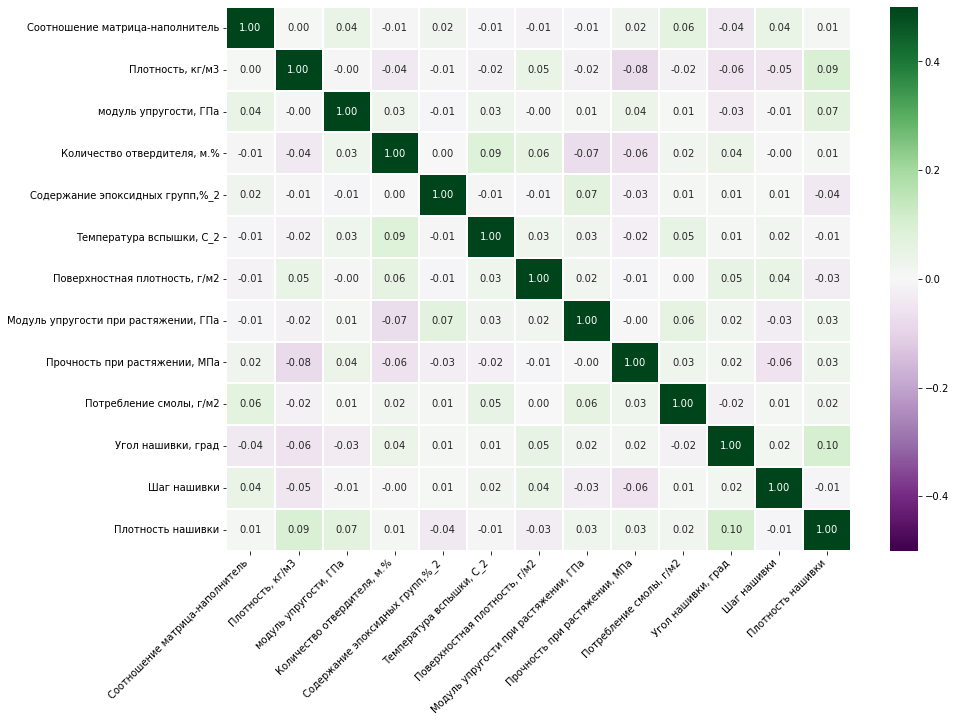

In [28]:
cor_map = df_join_clean.corr()
fig, ax = plt.subplots(figsize=(14, 10))
sns.heatmap(cor_map, vmin=-0.5, vmax=0.5, annot=True, fmt='.2f',cmap='PRGn', ax=ax, linewidths = 0.1)
plt.xticks(rotation=45, ha='right')
plt.show()


## Корреляции между переменными на тепловой карте визуально не выявлена

## Ящики с усами до удаления выбросов

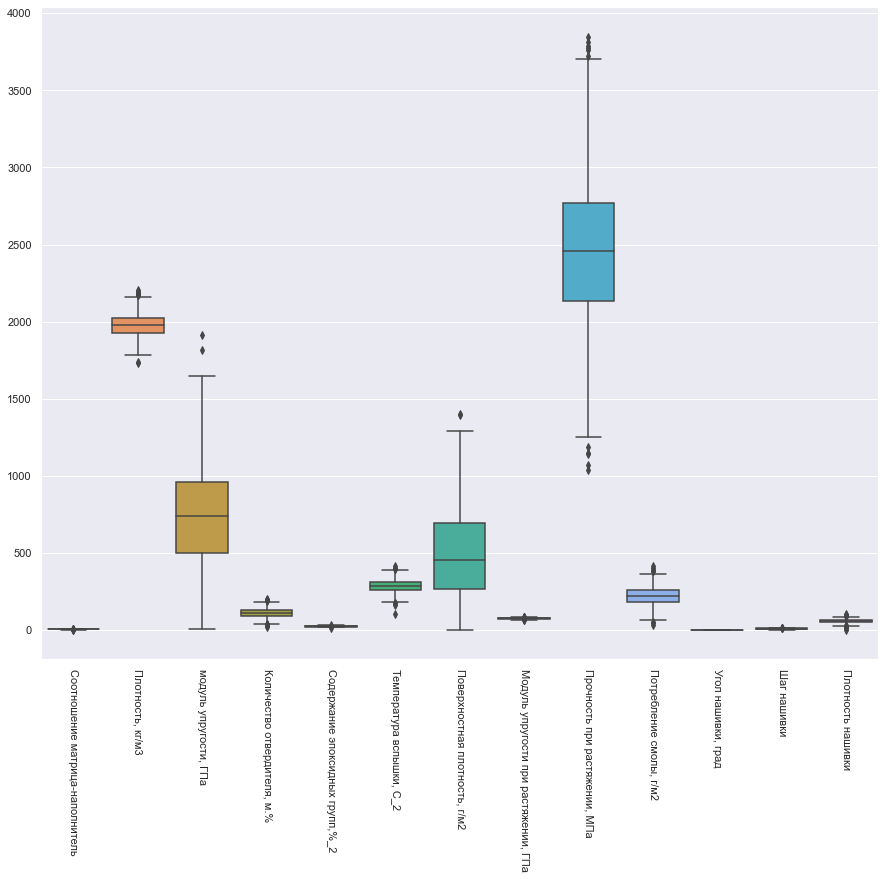

In [29]:
sns.set(rc={'figure.figsize':(15,12)})
ax = sns.boxplot(data=df_join)
ax.set_xticklabels(ax.get_xticklabels(),rotation=-90);



## Ящики с усами после удаления выбросов

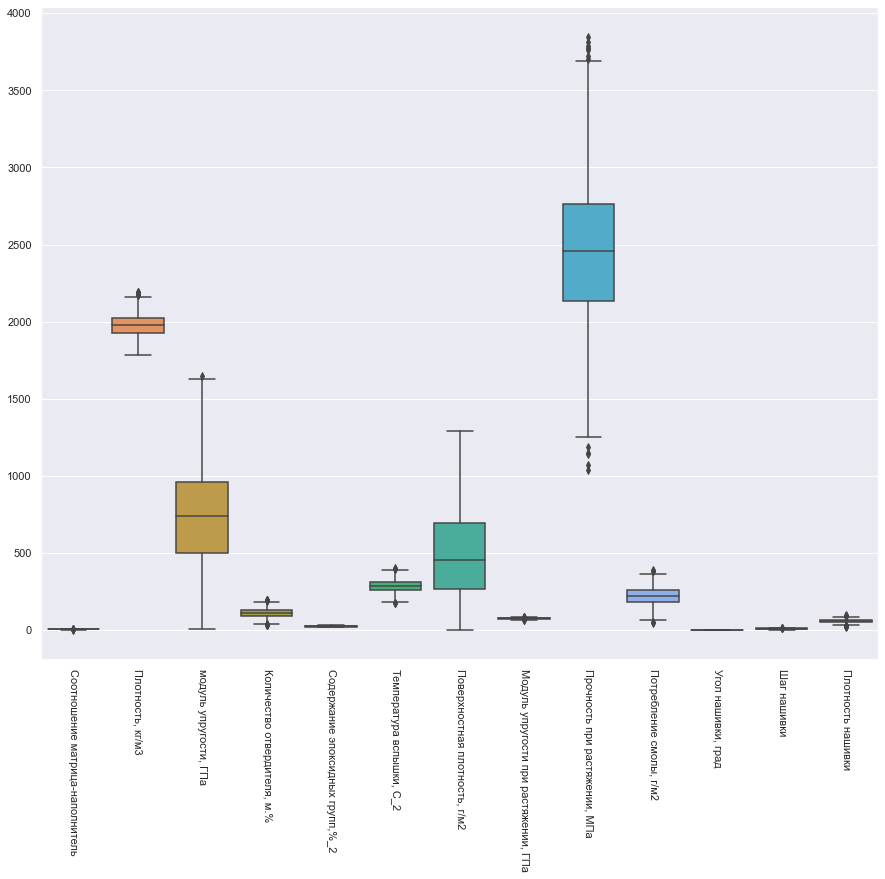

In [30]:
sns.set(rc={'figure.figsize':(15,12)})
ax = sns.boxplot(data=df_join_clean)
ax.set_xticklabels(ax.get_xticklabels(),rotation=-90);


## Нормализация

<AxesSubplot:ylabel='Density'>

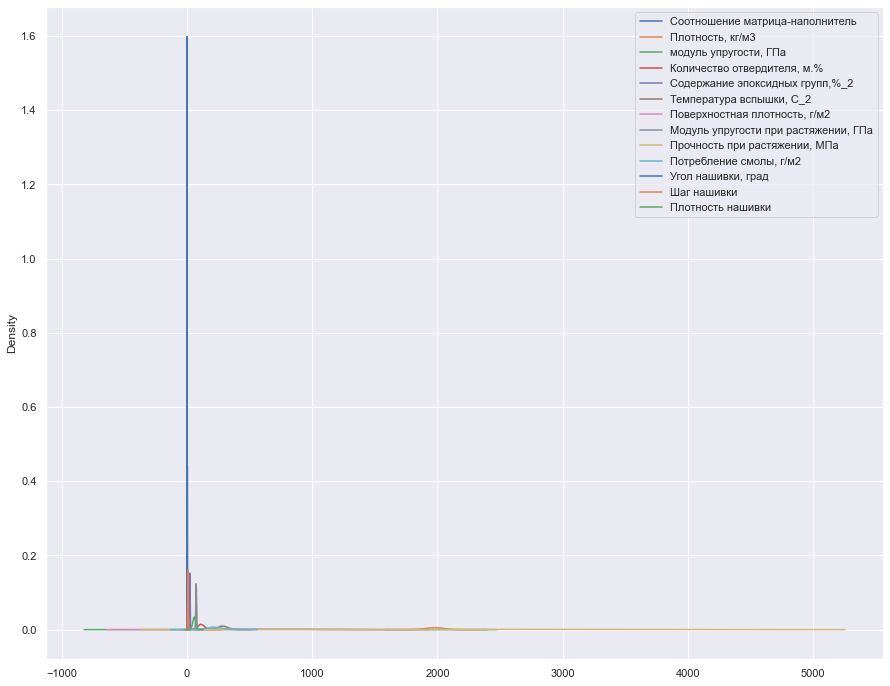

In [31]:
fig, ax = plt.subplots(figsize=(15, 12))
df_join_clean.plot(kind='kde', ax=ax)

### Видно, что данные находятся в разных диапазонах. Оценка плотности ядра показывает, что  данные нужно нормализовать

## Нормализуем данные

In [131]:

scaler = preprocessing.MinMaxScaler()
names = df_join_clean.columns
d = scaler.fit_transform(df_join_clean)
df_join_clean_norm = pd.DataFrame(d, columns=names).round(2)
df_join_clean_norm.head()

,Соотношение матрица-наполнитель,"Плотность, кг/м3","модуль упругости, ГПа","Количество отвердителя, м.%","Содержание эпоксидных групп,%_2","Температура вспышки, С_2","Поверхностная плотность, г/м2","Модуль упругости при растяжении, ГПа","Прочность при растяжении, МПа","Потребление смолы, г/м2","Угол нашивки, град",Шаг нашивки,Плотность нашивки
0,0.27,0.65,0.45,0.08,0.61,0.51,0.16,0.28,0.71,0.53,0.0,0.29,0.56
1,0.27,0.65,0.45,0.63,0.42,0.58,0.16,0.28,0.71,0.53,0.0,0.36,0.34
2,0.47,0.65,0.46,0.51,0.50,0.51,0.16,0.28,0.71,0.53,0.0,0.36,0.51
3,0.47,0.57,0.45,0.51,0.50,0.51,0.16,0.28,0.71,0.53,0.0,0.36,0.56
4,0.42,0.33,0.49,0.51,0.50,0.51,0.16,0.28,0.71,0.53,0.0,0.36,0.73


## Описательная статистика характеристик после нормализации

In [33]:
df_join_clean_norm.describe().T.round(2)

,count,mean,std,min,25%,50%,75%,max
Соотношение матрица-наполнитель,999.0,0.49,0.17,0.0,0.37,0.48,0.61,1.0
"Плотность, кг/м3",999.0,0.47,0.18,0.0,0.34,0.47,0.58,1.0
"модуль упругости, ГПа",999.0,0.45,0.20,0.0,0.30,0.45,0.58,1.0
"Количество отвердителя, м.%",999.0,0.50,0.17,0.0,0.38,0.50,0.61,1.0
"Содержание эпоксидных групп,%_2",999.0,0.49,0.18,0.0,0.37,0.49,0.62,1.0
"Температура вспышки, С_2",999.0,0.49,0.17,0.0,0.37,0.49,0.61,1.0
"Поверхностная плотность, г/м2",999.0,0.37,0.22,0.0,0.21,0.35,0.54,1.0
"Модуль упругости при растяжении, ГПа",999.0,0.50,0.17,0.0,0.39,0.50,0.61,1.0
"Прочность при растяжении, МПа",999.0,0.51,0.17,0.0,0.39,0.50,0.61,1.0
"Потребление смолы, г/м2",999.0,0.51,0.17,0.0,0.40,0.51,0.62,1.0


In [34]:
df_join_clean_norm.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 999 entries, 0 to 998
Data columns (total 13 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Соотношение матрица-наполнитель       999 non-null    float64
 1   Плотность, кг/м3                      999 non-null    float64
 2   модуль упругости, ГПа                 999 non-null    float64
 3   Количество отвердителя, м.%           999 non-null    float64
 4   Содержание эпоксидных групп,%_2       999 non-null    float64
 5   Температура вспышки, С_2              999 non-null    float64
 6   Поверхностная плотность, г/м2         999 non-null    float64
 7   Модуль упругости при растяжении, ГПа  999 non-null    float64
 8   Прочность при растяжении, МПа         999 non-null    float64
 9   Потребление смолы, г/м2               999 non-null    float64
 10  Угол нашивки, град                    999 non-null    float64
 11  Шаг нашивки        

## Ящики с усами после нормализации данных

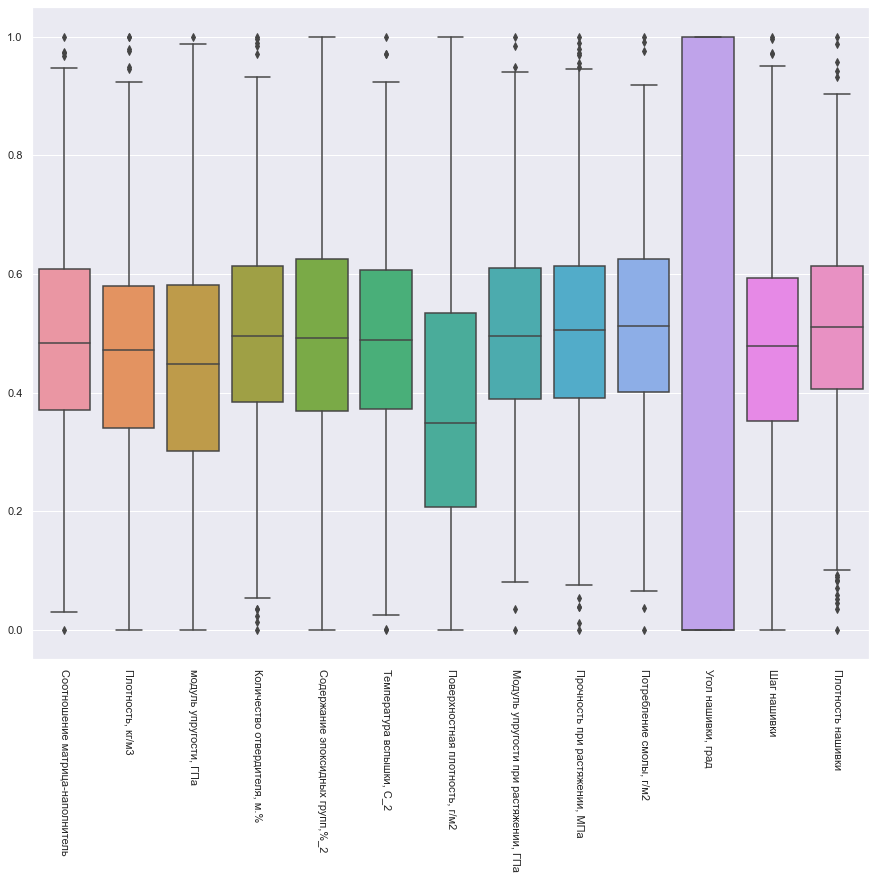

In [35]:
min_max_scaler = preprocessing.MinMaxScaler()
df_join_clean_norm = pd.DataFrame(min_max_scaler.fit_transform(df_join_clean),
    columns = df_join_clean.columns,
    index = df_join_clean.index)
sns.set(rc={'figure.figsize':(15,12)})
ax = sns.boxplot(data=df_join_clean_norm)
ax.set_xticklabels(ax.get_xticklabels(),rotation=-90);

## Гистограммы после нормализации

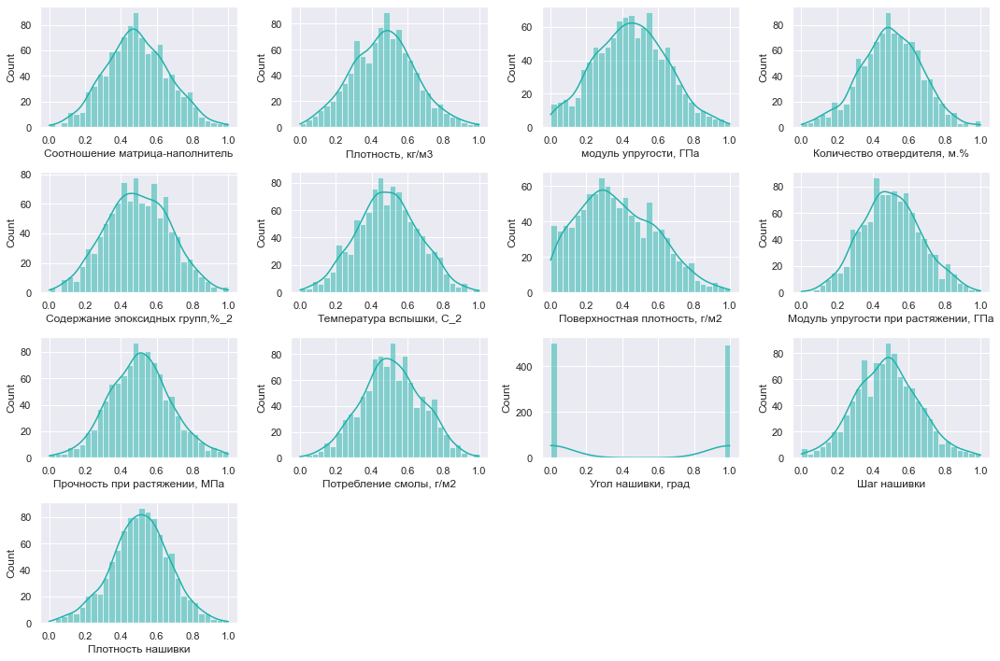

In [36]:
histodraw(df_join_clean_norm, df_join_clean.columns, 4, 4)

 ## Попарные графики рассеяния после нормализации

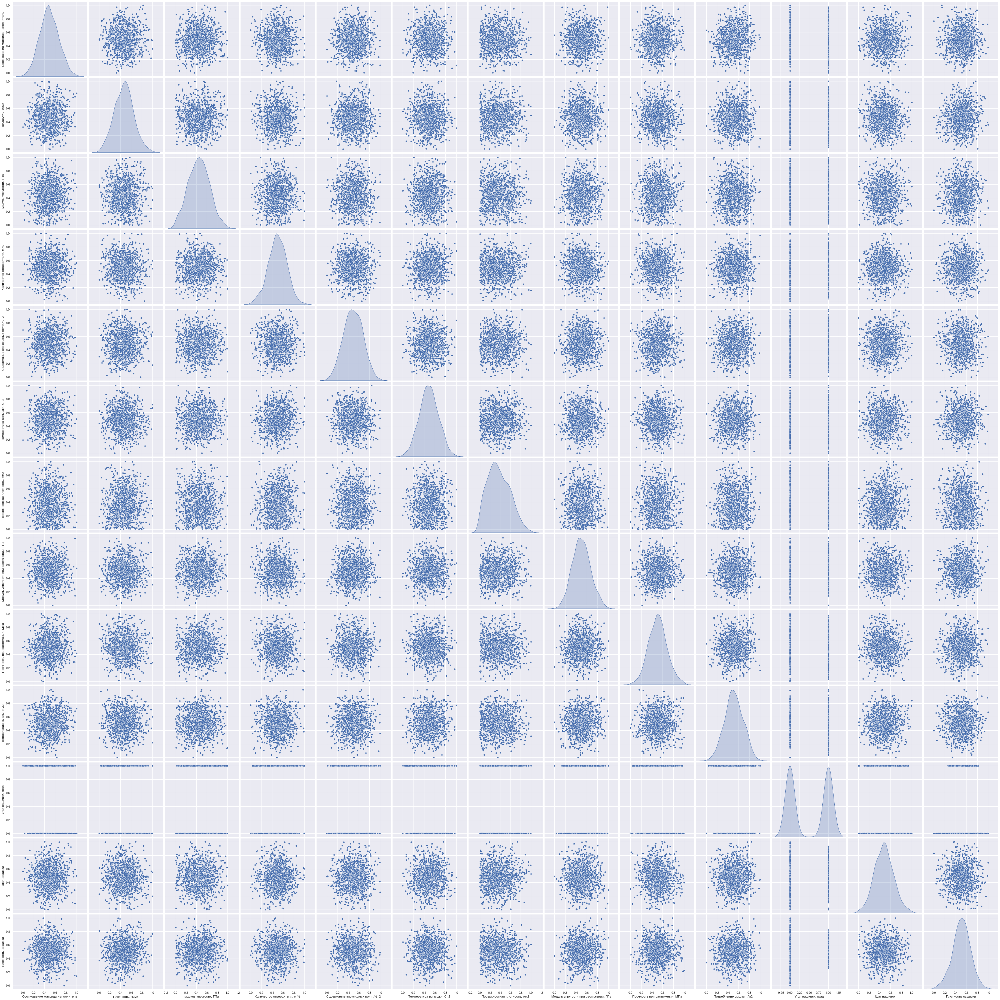

In [37]:
sns.pairplot(df_join_clean_norm, height=4, diag_kind='kde');

## Корреляционная матрица после номализации данных

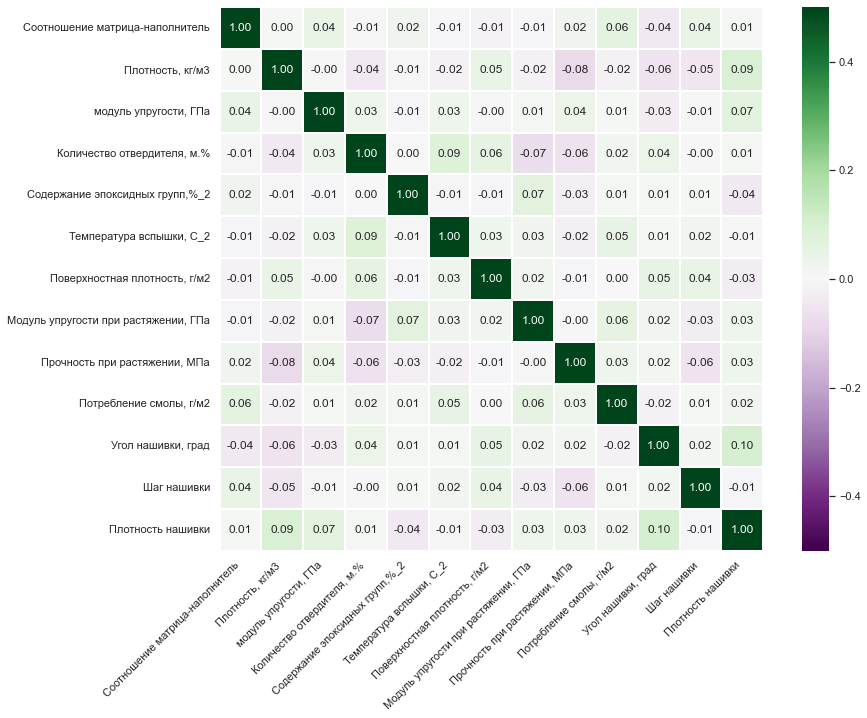

In [38]:
cor_map = df_join_clean_norm.corr()
fig, ax = plt.subplots(figsize=(14, 10))
sns.heatmap(cor_map, vmin=-0.5, vmax=0.5,  annot=True, square=True, fmt='.2f',cmap='PRGn', ax=ax, linewidths = 0.1)
plt.xticks(rotation=45, ha='right')
plt.show()

## Модели для прогноза модуля упругости при растяжении и прочности при растяжении. 

## Сформируем входы и выходы для моделей

In [39]:
df_output_upr = df_join_clean_norm['Модуль упругости при растяжении, ГПа']
df_output_pro = df_join_clean_norm['Прочность при растяжении, МПа']

df_input_upr = df_join_clean_norm.loc[:, df_join_clean_norm.columns != 'Модуль упругости при растяжении, ГПа']
df_input_pro = df_join_clean_norm.loc[:, df_join_clean_norm.columns != 'Прочность при растяжении, МПа']

## Разделим датасет на обучающую и тестовую выборки

In [40]:


X_input_upr, X_output_upr,  y_input_upr, y_output_upr = train_test_split(df_input_upr, df_output_upr , test_size=0.3, random_state=42)
X_input_pro, X_output_pro, y_input_pro, y_output_pro = train_test_split(df_input_pro, df_output_pro, test_size=0.3, random_state=42)

## Правильности разбиения проверена

In [43]:
df_join_clean_norm.shape[0] - X_input_upr.shape[0] - X_output_upr.shape[0]
df_join_clean_norm.shape[0] - X_input_pro.shape[0] - X_output_pro.shape[0]

0

## Имена моделей и ошибки моделей поместим в датафрейм

In [44]:
df_errors = pd.DataFrame(columns=['target_var','model_name','MSE','R2'])

## Определение функции для визуализации

In [45]:
def actual_and_predicted_plot(orig, predict, var, model_name):    
    plt.figure(figsize=(17,5))
    plt.title(f'Тестовые и прогнозные значения: {model_name}')
    plt.plot(orig, label='Тест')
    plt.plot(predict, label='Прогноз')
    plt.legend(loc='best')
    plt.ylabel(var)
    plt.xlabel('Количество наблюдений')
    plt.show()

## Линейная регрессия

In [46]:
# модуль упругости при растяжении

linear_model_upr = LinearRegression()
linear_model_upr.fit(X_input_upr,  y_input_upr)
prediction_y_test_linear_1 = linear_model_upr.predict(X_output_upr)


MSE_upr = mean_squared_error(y_output_upr, prediction_y_test_linear_1)
R2_upr = r2_score(y_output_upr, prediction_y_test_linear_1)

# прочность при растяжении
linear_model_pro = LinearRegression()
linear_model_pro.fit(X_input_pro, y_input_pro)
prediction_y_test_linear_2 = linear_model_pro.predict(X_output_pro)

MSE_pro = mean_squared_error(y_output_pro, prediction_y_test_linear_2)
R2_pro = r2_score(y_output_pro, prediction_y_test_linear_2)


linear_errors = pd.DataFrame({'model_name':'LinearRegression',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pro],\
                               'R2':[R2_upr, R2_pro]})
df_errors = pd.concat([df_errors, linear_errors], ignore_index=True)
df_errors

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.02798,-0.027603
1,"Прочность при растяжении, МПа",LinearRegression,0.028816,-0.011552


## Визуализация

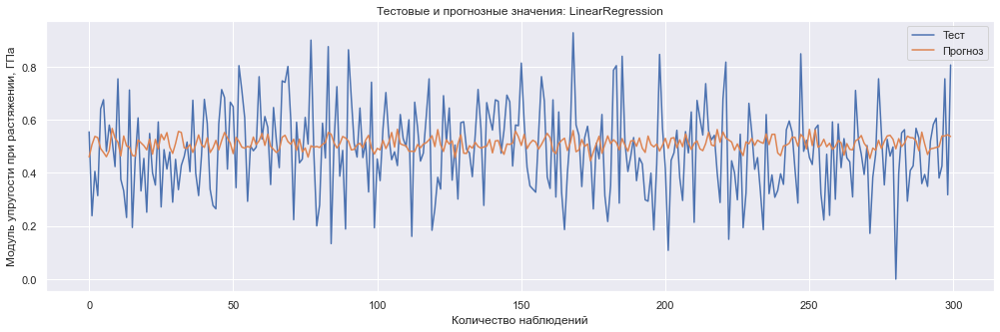

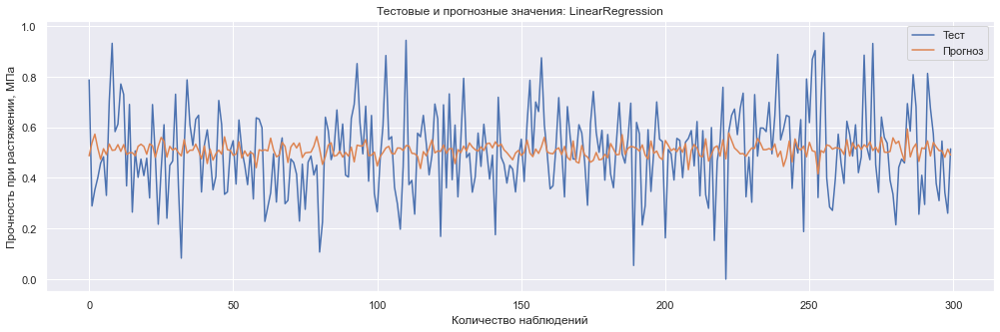

In [47]:
actual_and_predicted_plot(y_output_upr.values, prediction_y_test_linear_1, 'Модуль упругости при растяжении, ГПа', 'LinearRegression')
actual_and_predicted_plot(y_output_pro.values, prediction_y_test_linear_2, 'Прочность при растяжении, МПа', 'LinearRegression')

##  Регрессия k-ближайших соседей

In [49]:
%%time

knr_model = KNeighborsRegressor()
neigh_params = {'n_neighbors' : range(1, 101, 1), 
          'weights' : ['uniform', 'distance'],
          'algorithm' : ['auto', 'ball_tree', 'kd_tree', 'brute']
          }

GSCV_neigh_1 = GridSearchCV(knr_model, neigh_params, n_jobs=-1, cv=10)
GSCV_neigh_1.fit(X_input_upr,  y_input_upr)
# GSCV_neigh_1.best_params_
neigh_1 = GSCV_neigh_1.best_estimator_

MSE_upr = mean_squared_error(y_output_upr, neigh_1.predict(X_output_upr))
R2_upr = r2_score(y_output_upr, neigh_1.predict(X_output_upr))

GSCV_neigh_2 = GridSearchCV(knr_model, neigh_params, n_jobs=-1, cv=10)
GSCV_neigh_2.fit(X_input_pro, y_input_pro)
# GSCV_neigh_2.best_params_
neigh_2 = GSCV_neigh_2.best_estimator_

MSE_pro = mean_squared_error(y_output_pro, neigh_2.predict(X_output_pro))
R2_pro = r2_score(y_output_pro, neigh_2.predict(X_output_pro))


neigh_errors = pd.DataFrame({'model_name':'KNeighborsRegressor',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pro],\
                               'R2':[R2_upr, R2_pro]})
df_errors = pd.concat([df_errors, neigh_errors], ignore_index=True)
df_errors

CPU times: user 2.94 s, sys: 231 ms, total: 3.17 s
Wall time: 25.4 s


,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.02798,-0.027603
1,"Прочность при растяжении, МПа",LinearRegression,0.028816,-0.011552
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.02771,-0.017687
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.02899,-0.017683


## Визуализация

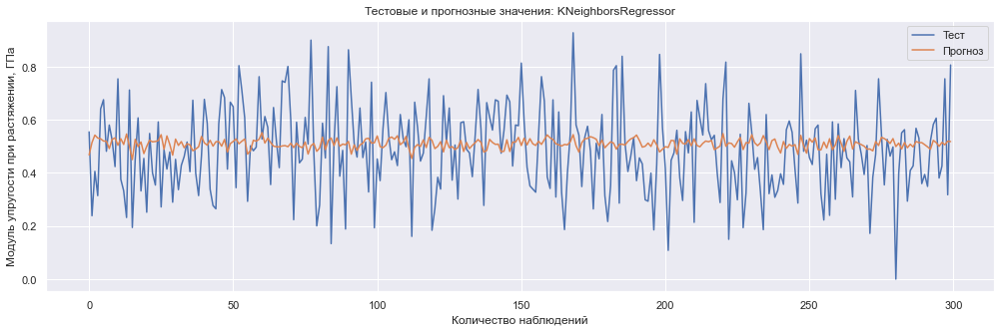

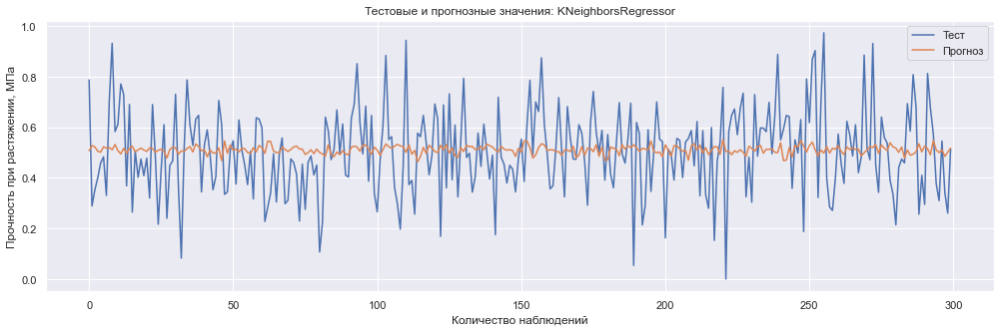

In [50]:
actual_and_predicted_plot(y_output_upr.values, neigh_1.predict(X_output_upr), 'Модуль упругости при растяжении, ГПа', 'KNeighborsRegressor')
actual_and_predicted_plot(y_output_pro.values, neigh_2.predict(X_output_pro), 'Прочность при растяжении, МПа', 'KNeighborsRegressor')

# Случайный лес

In [52]:
%%time

rfr_model = RandomForestRegressor(random_state=14)
rfr_model_params = {
    'n_estimators' : range(1, 100, 5),
    'max_features': ['auto', 'sqrt', 'log2'],
    'max_depth' : range(1, 5, 1),
    'criterion':['mse']
}
GSCV_rfr_model_upr = GridSearchCV(rfr_model, rfr_model_params, cv=5, verbose=2)
GSCV_rfr_model_upr.fit(X_input_upr,  y_input_upr)
# GSCV_rfr_model_upr.best_params_
rfr_model_upr = GSCV_rfr_model_upr.best_estimator_

MSE_upr = mean_squared_error(y_output_upr, rfr_model_upr.predict(X_output_upr))
R2_upr = r2_score(y_output_upr, rfr_model_upr.predict(X_output_upr))

GSCV_rfr_model_upr = GridSearchCV(rfr_model, rfr_model_params, cv=5, verbose=2)
GSCV_rfr_model_upr.fit(X_input_pro, y_input_pro)
# GSCV_rfr_model_upr.best_params_
rfr_model_upr = GSCV_rfr_model_upr.best_estimator_

MSE_pro = mean_squared_error(y_output_pro, rfr_model_upr.predict(X_output_pro))
R2_pro = r2_score(y_output_pro, rfr_model_upr.predict(X_output_pro))

rf_errors = pd.DataFrame({'model_name':'RandomForestRegressor',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pro],\
                               'R2':[R2_upr, R2_pro]})
df_errors = pd.concat([df_errors, rf_errors], ignore_index=True)
df_errors

Fitting 5 folds for each of 240 candidates, totalling 1200 fits
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, ma

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total ti

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.3s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=11; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.3s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.4s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.6s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.3s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.1s
Fitting 5 folds for each of 240 candidates, totalling 1200 fits
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, m

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=6; total time=   0.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total t

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=41; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=6; total time=   0.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=41; total time=   0.0s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=1, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=2, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=11; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=26; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=61; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=36; total time=   0.0s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=3, max_features=log2, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=21; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=26; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=71; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.




[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=76; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=81; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=86; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=91; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.2s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=auto, n_estimators=96; total time=   0.2s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=31; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=sqrt, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=1; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=6; total time=   0.0

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=11; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=16; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=21; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=26; total time=   0.0s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/a

[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=31; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=36; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=41; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=46; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=51; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=56; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=61; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=66; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=71; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=76; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=81; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=86; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=91; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.1s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.1s
[CV] END criterion=mse, max_depth=4, max_features=log2, n_estimators=96; total time=   0.1s
CPU times: user 2min 52s, sys: 4.12 s, total: 2min 56s
Wall time: 3min 5s


/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/ensemble/_forest.py:396: FutureWarning:

Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.



,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.02798,-0.027603
1,"Прочность при растяжении, МПа",LinearRegression,0.028816,-0.011552
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.02771,-0.017687
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.02899,-0.017683
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.027618,-0.014302
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.028608,-0.004257


## Визуализация

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/base.py:493: FutureWarning:

The feature names should match those that were passed during fit. Starting version 1.2, an error will be raised.
Feature names unseen at fit time:
- Прочность при растяжении, МПа
Feature names seen at fit time, yet now missing:
- Модуль упругости при растяжении, ГПа




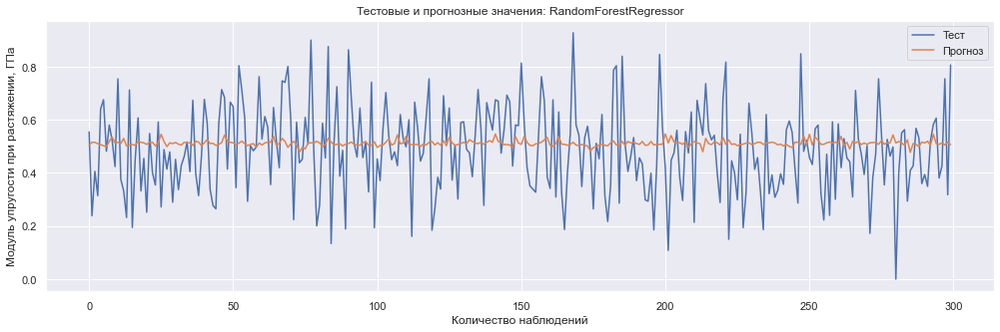

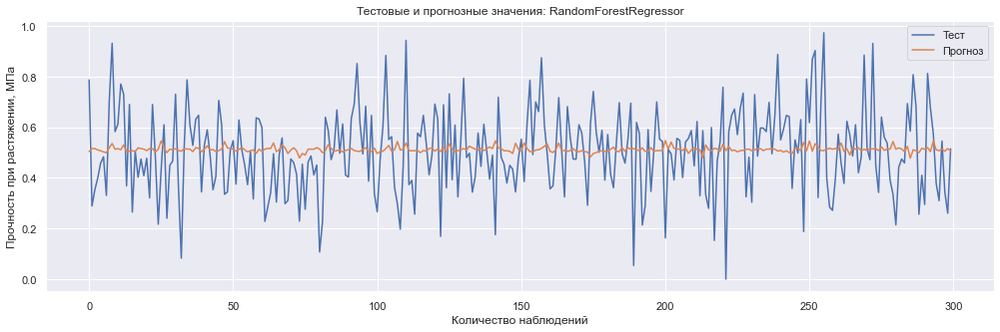

In [53]:
actual_and_predicted_plot(y_output_upr.values, rfr_model_upr.predict(X_output_upr), 'Модуль упругости при растяжении, ГПа', 'RandomForestRegressor')
actual_and_predicted_plot(y_output_pro.values, rfr_model_upr.predict(X_output_pro), 'Прочность при растяжении, МПа', 'RandomForestRegressor')

## Многослойный перцептрон

In [130]:
%%time

mlpr_model = MLPRegressor(random_state=14)
mlpr_model_params = {
    'hidden_layer_sizes' : [(100, 100, 50, 25, 12), (144, 144, 72, 36, 12, 1), (12, 12, 12, 12, 12),
                            (144, 144, 144, 72, 72, 36, 36), ()],
    'activation' : ['identity', 'logistic', 'tanh', 'relu'],
    'solver' : ['sgd', 'adam'],
    'max_iter' : [100],
    'learning_rate' : ['constant', 'adaptive', 'invscaling']
}

GSCV_mlpr_model_upr = GridSearchCV(mlpr_model, mlpr_model_params, n_jobs=-1, cv=10)
GSCV_mlpr_model_upr.fit(X_input_upr,  y_input_upr)
# GSCV_mlpr_model_upr.best_params_
mlpr_model_upr = GSCV_mlpr_model_upr.best_estimator_

MSE_upr = mean_squared_error(y_output_upr, mlpr_model_upr.predict(X_output_upr))
R2_upr = r2_score(y_output_upr, mlpr_model_upr.predict(X_output_upr))

GSCV_mlpr_model_pro = GridSearchCV(mlpr_model, mlpr_model_params, n_jobs=-1, cv=10)
GSCV_mlpr_model_pro.fit(X_input_pro, y_input_pro)
# GSCV_mlpr_model_pro.best_params_
mlpr_model_pro = GSCV_mlpr_model_pro.best_estimator_

MSE_pro = mean_squared_error(y_output_pro, mlpr_model_pro.predict(X_output_pro))
R2_pro = r2_score(y_output_pro, mlpr_model_pro.predict(X_output_pro))

mlpr_model_errors = pd.DataFrame({'model_name':'MLPRegressor',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pro],\
                               'R2':[R2_upr, R2_pro]})
df_errors = pd.concat([df_errors, mlpr_model_errors], ignore_index=True)
df_errors

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:692: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
 

CPU times: user 8.05 s, sys: 420 ms, total: 8.47 s
Wall time: 5min 4s


,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.02798,-0.027603
1,"Прочность при растяжении, МПа",LinearRegression,0.028816,-0.011552
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.02771,-0.017687
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.02899,-0.017683
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.027618,-0.014302
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.028608,-0.004257
6,"Модуль упругости при растяжении, ГПа",MLPRegressor,0.027748,-0.019085
7,"Прочность при растяжении, МПа",MLPRegressor,0.02851,-0.000818
8,"Модуль упругости при растяжении, ГПа",lasso_model,0.027704,-0.017458
9,"Прочность при растяжении, МПа",lasso_model,0.028513,-0.000928


## Параметры модели по сетке

In [56]:
GSCV_mlpr_model_upr.best_params_

{'activation': 'relu',
 'hidden_layer_sizes': (144, 144, 144, 72, 72, 36, 36),
 'learning_rate': 'adaptive',
 'max_iter': 100,
 'solver': 'sgd'}

In [57]:
GSCV_mlpr_model_pro.best_params_

{'activation': 'logistic',
 'hidden_layer_sizes': (100, 100, 50, 25, 12),
 'learning_rate': 'constant',
 'max_iter': 100,
 'solver': 'adam'}

In [58]:
mlpr_model_upr.predict(X_output_upr)

array([0.51005203, 0.50713931, 0.51447915, 0.50970308, 0.50886099,
       0.50976689, 0.50717226, 0.50719002, 0.49974725, 0.50130896,
       0.50558659, 0.51009853, 0.49875885, 0.50520392, 0.50031259,
       0.50532633, 0.507734  , 0.50880494, 0.51606299, 0.50925606,
       0.50496863, 0.51471726, 0.50357072, 0.50653962, 0.50672876,
       0.50934939, 0.51143037, 0.50814447, 0.50246772, 0.50998557,
       0.50528385, 0.51011827, 0.50227462, 0.50506357, 0.50557068,
       0.5056421 , 0.50441068, 0.51703748, 0.4992454 , 0.50612381,
       0.50575787, 0.49324802, 0.5093939 , 0.50152199, 0.50912739,
       0.50921392, 0.51007377, 0.50381575, 0.5071748 , 0.50566066,
       0.50344411, 0.50165725, 0.5075033 , 0.50452118, 0.507001  ,
       0.50398002, 0.50943295, 0.5036096 , 0.5074077 , 0.5034428 ,
       0.51215728, 0.50680716, 0.50079091, 0.51061164, 0.50189272,
       0.50914638, 0.50717184, 0.50347427, 0.51185184, 0.50580131,
       0.51171039, 0.51270939, 0.50925749, 0.50435561, 0.51237

## Визуализация

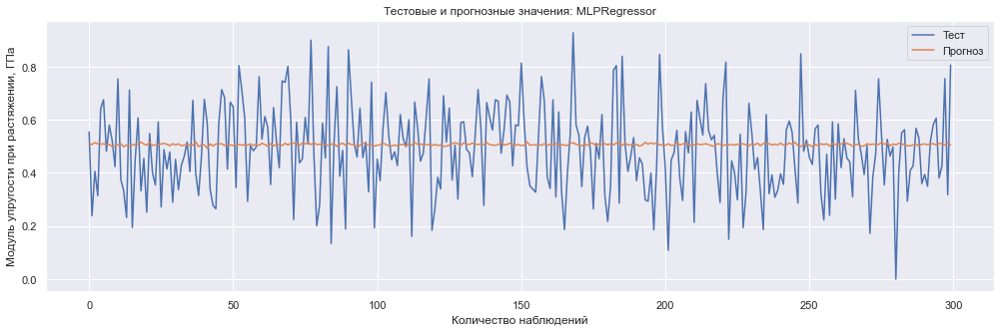

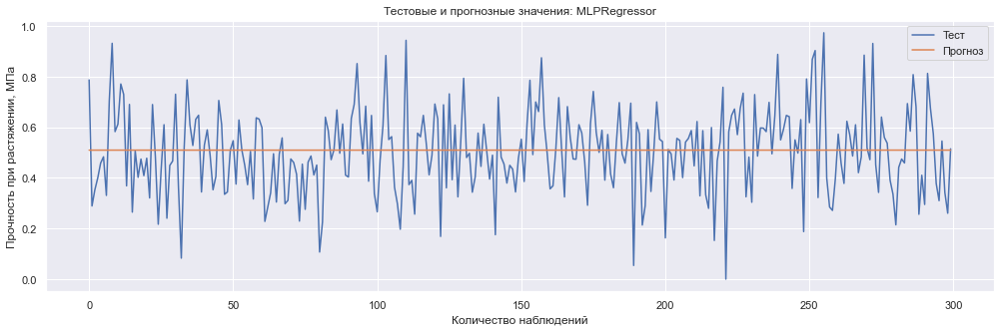

In [59]:
actual_and_predicted_plot(y_output_upr.values, mlpr_model_upr.predict(X_output_upr), 'Модуль упругости при растяжении, ГПа', 'MLPRegressor')
actual_and_predicted_plot(y_output_pro.values, mlpr_model_pro.predict(X_output_pro), 'Прочность при растяжении, МПа', 'MLPRegressor')

## Лассо регрессия

In [61]:
lasso_model = Lasso(random_state=14)
lasso_model_params = {
   'alpha': np.linspace(0, 1, 100)
}
GSCV_lasso_model_upr = GridSearchCV(lasso_model, lasso_model_params, cv=10, verbose=2)
GSCV_lasso_model_upr.fit(X_input_upr,  y_input_upr)
# GSCV_lasso_model_upr.best_params_ 

lasso_model_upr = GSCV_lasso_model_upr.best_estimator_

MSE_upr = mean_squared_error(y_output_upr, lasso_model_upr.predict(X_output_upr))
R2_upr = r2_score(y_output_upr, lasso_model_upr.predict(X_output_upr))

GSCV_lasso_model_pro = GridSearchCV(lasso_model, lasso_model_params, cv=10, verbose=2)
GSCV_lasso_model_pro.fit(X_input_pro, y_input_pro)
# GSCV_lasso_model_pro.best_params_ 

lasso_model_pro = GSCV_lasso_model_pro.best_estimator_
MSE_pro = mean_squared_error(y_output_pro, lasso_model_pro.predict(X_output_pro))
R2_pro = r2_score(y_output_pro, lasso_model_pro.predict(X_output_pro))

lasso_model_errors = pd.DataFrame({'model_name':'lasso_model',\
                                'target_var':['Модуль упругости при растяжении, ГПа', 'Прочность при растяжении, МПа'],\
                               'MSE':[MSE_upr, MSE_pro],\
                               'R2':[R2_upr, R2_pro]})
df_errors = pd.concat([df_errors, lasso_model_errors], ignore_index=True)
df_errors

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END .........................alpha=0.010101010101010102; total time=   0.0s
[CV] END .........................alpha=0.01

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: UserWarning:

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: UserWarning:

Coordinate descent with no regularization may lead to unexpected results and is discouraged.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 8.653e+00, tolerance: 1.772e-03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.

/Users/novyjpolzovatel/opt/an

[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ..........................alpha=0.15151515151515152; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ..........................alpha=0.26262626262626265; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.4040404040404041; total time=   0.0s
[CV] END ...........................alpha=0.4040404040404041; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...........................alpha=0.4141414141414142; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.5555555555555556; total time=   0.0s
[CV] END ...........................alpha=0.5555555555555556; total time=   0.0s
[CV] END ...........................alpha=0.5555555555555556; total time=   0.0s
[CV] END ...........................alpha=0.5555555555555556; total time=   0.0s
[CV] END ...........................alpha=0.5555555555555556; total time=   0.0s
[CV] END ...........................alpha=0.5555555555555556; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.6666666666666667; total time=   0.0s
[CV] END ...........................alpha=0.6666666666666667; total time=   0.0s
[CV] END ...........................alpha=0.6666666666666667; total time=   0.0s
[CV] END ...........................alpha=0.6666666666666667; total time=   0.0s
[CV] END ...........................alpha=0.6666666666666667; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.7676767676767677; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ...................

[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...................

[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ..........................................alpha=0.0; total time=   0.0s
[CV] END ...................................

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:680: UserWarning:

With alpha=0, this algorithm does not converge well. You are advised to use the LinearRegression estimator

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: UserWarning:

Coordinate descent with no regularization may lead to unexpected results and is discouraged.

/Users/novyjpolzovatel/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_coordinate_descent.py:647: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.234e+00, tolerance: 1.880e-03 Linear regression models with null weight for the l1 regularization term are more efficiently fitted using one of the solvers implemented in sklearn.linear_model.Ridge/RidgeCV instead.

/Users/novyjpolzovatel/opt/an

[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END .........................alpha=0.030303030303030304; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ..........................alpha=0.04040404040404041; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.13131313131313133; total time=   0.0s
[CV] END ..........................alpha=0.13131313131313133; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ..........................alpha=0.14141414141414144; total time=   0.0s
[CV] END ...................

[CV] END ..........................alpha=0.24242424242424243; total time=   0.0s
[CV] END ..........................alpha=0.24242424242424243; total time=   0.0s
[CV] END ..........................alpha=0.24242424242424243; total time=   0.0s
[CV] END ..........................alpha=0.24242424242424243; total time=   0.0s
[CV] END ..........................alpha=0.24242424242424243; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ..........................alpha=0.25252525252525254; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.3434343434343435; total time=   0.0s
[CV] END ...........................alpha=0.3434343434343435; total time=   0.0s
[CV] END ...........................alpha=0.3434343434343435; total time=   0.0s
[CV] END ...........................alpha=0.3535353535353536; total time=   0.0s
[CV] END ...........................alpha=0.3535353535353536; total time=   0.0s
[CV] END ...........................alpha=0.3535353535353536; total time=   0.0s
[CV] END ...........................alpha=0.3535353535353536; total time=   0.0s
[CV] END ...........................alpha=0.3535353535353536; total time=   0.0s
[CV] END ...........................alpha=0.3535353535353536; total time=   0.0s
[CV] END ...........................alpha=0.3535353535353536; total time=   0.0s
[CV] END ...........................alpha=0.3535353535353536; total time=   0.0s
[CV] END ...........................alpha=0.3535353535353536; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.4545454545454546; total time=   0.0s
[CV] END ...........................alpha=0.4545454545454546; total time=   0.0s
[CV] END ...........................alpha=0.4545454545454546; total time=   0.0s
[CV] END ...........................alpha=0.4545454545454546; total time=   0.0s
[CV] END ...........................alpha=0.4646464646464647; total time=   0.0s
[CV] END ...........................alpha=0.4646464646464647; total time=   0.0s
[CV] END ...........................alpha=0.4646464646464647; total time=   0.0s
[CV] END ...........................alpha=0.4646464646464647; total time=   0.0s
[CV] END ...........................alpha=0.4646464646464647; total time=   0.0s
[CV] END ...........................alpha=0.4646464646464647; total time=   0.0s
[CV] END ...........................alpha=0.4646464646464647; total time=   0.0s
[CV] END ...........................alpha=0.4646464646464647; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5656565656565657; total time=   0.0s
[CV] END ...........................alpha=0.5757575757575758; total time=   0.0s
[CV] END ...........................alpha=0.5757575757575758; total time=   0.0s
[CV] END ...........................alpha=0.5757575757575758; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.6666666666666667; total time=   0.0s
[CV] END ...........................alpha=0.6666666666666667; total time=   0.0s
[CV] END ...........................alpha=0.6666666666666667; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...........................alpha=0.6767676767676768; total time=   0.0s
[CV] END ...................

[CV] END ...........................alpha=0.7777777777777778; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.787878787878788; total time=   0.0s
[CV] END ............................alpha=0.797979797979798; total time=   0.0s
[CV] END ...................

[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ............................alpha=0.888888888888889; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...........................alpha=0.8989898989898991; total time=   0.0s
[CV] END ...................

[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s
[CV] END ..........................................alpha=1.0; total time=   0.0s


,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.02798,-0.027603
1,"Прочность при растяжении, МПа",LinearRegression,0.028816,-0.011552
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.02771,-0.017687
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.02899,-0.017683
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.027618,-0.014302
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.028608,-0.004257
6,"Модуль упругости при растяжении, ГПа",MLPRegressor,0.027748,-0.019085
7,"Прочность при растяжении, МПа",MLPRegressor,0.02851,-0.000818
8,"Модуль упругости при растяжении, ГПа",lasso_model,0.027704,-0.017458
9,"Прочность при растяжении, МПа",lasso_model,0.028513,-0.000928


## Визуализация

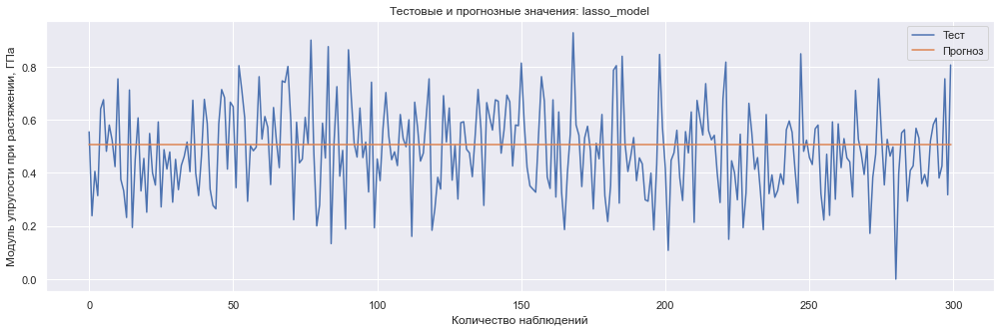

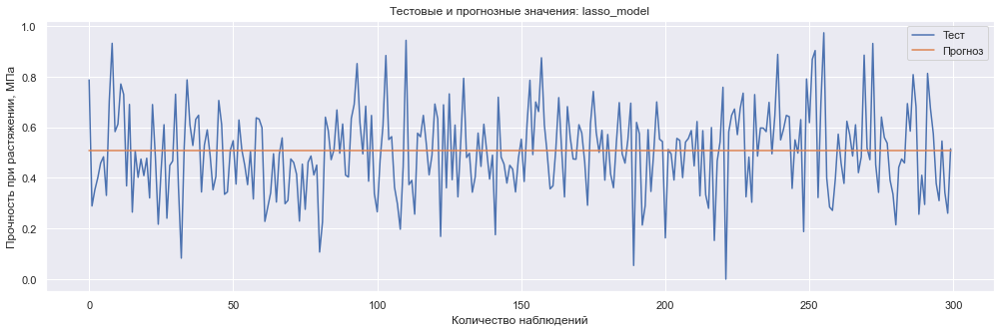

In [62]:
actual_and_predicted_plot(y_output_upr.values, lasso_model_upr.predict(X_output_upr), 'Модуль упругости при растяжении, ГПа', 'lasso_model')
actual_and_predicted_plot(y_output_pro.values, lasso_model_pro.predict(X_output_pro), 'Прочность при растяжении, МПа', 'lasso_model')

# Покажем датасет с ошибками

In [63]:
df_errors

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.02798,-0.027603
1,"Прочность при растяжении, МПа",LinearRegression,0.028816,-0.011552
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.02771,-0.017687
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.02899,-0.017683
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.027618,-0.014302
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.028608,-0.004257
6,"Модуль упругости при растяжении, ГПа",MLPRegressor,0.027748,-0.019085
7,"Прочность при растяжении, МПа",MLPRegressor,0.02851,-0.000818
8,"Модуль упругости при растяжении, ГПа",lasso_model,0.027704,-0.017458
9,"Прочность при растяжении, МПа",lasso_model,0.028513,-0.000928


# Рекомендательная нейросеть для соотношения матрица-наполнитель. 

In [107]:
df_bp = pd.read_excel('dataset/X_bp.xlsx')
df_nup = pd.read_excel('dataset/X_nup.xlsx')

In [108]:
df = df_bp.merge(df_nup, on='Unnamed: 0', how='inner')
df.drop(columns=['Unnamed: 0'], inplace=True)

In [109]:
# Удалим выбросы далее 1,5 межквартильных размахов. Работать с датасетом, где выбросы удалены по проавилу 3-сигм приводить к сключительной ситуации и остановке ядра. 

Q1 = df.quantile(0.25)
Q3 = df.quantile(0.75)
IQR = Q3-Q1

df_join_clean = df[~((df<(Q1-1.5*IQR))|(df>(Q3+1.5*IQR))).any(axis=1)]

## Сформируем входы и выходы для моделей. Разделим датасет на обучающую и тестовую выборки.

In [110]:
target_var = df_join_clean['Соотношение матрица-наполнитель']
train_vars = df_join_clean.loc[:, df_join_clean.columns != 'Соотношение матрица-наполнитель']

x_train, x_test, y_train, y_test = train_test_split(train_vars, target_var, test_size=0.3, random_state=42)

## Данные надо нормализовать 

In [111]:
x_train_normalizer = tf.keras.layers.Normalization(axis=-1)
x_train_normalizer.adapt(np.array(x_train))

## Определим слои и конфигурацию нейросети

In [112]:
model = tf.keras.Sequential([x_train_normalizer, layers.Dense(128, activation='relu'), 
                                                 layers.Dense(128, activation='relu'),                                                  
                                                 layers.Dense(128, activation='relu'),
                                                 layers.Dense(64, activation='relu'),
                                                 layers.Dense(32, activation='relu'),
                                                 layers.Dense(16, activation='relu'),
                                                 layers.Dense(1)
                                                ])

model.compile(optimizer=tf.keras.optimizers.Adam(0.001), loss='mean_squared_error')   

In [113]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 normalization_4 (Normalizat  (None, 12)               25        
 ion)                                                            
                                                                 
 dense_42 (Dense)            (None, 128)               1664      
                                                                 
 dense_43 (Dense)            (None, 128)               16512     
                                                                 
 dense_44 (Dense)            (None, 128)               16512     
                                                                 
 dense_45 (Dense)            (None, 64)                8256      
                                                                 
 dense_46 (Dense)            (None, 32)                2080      
                                                      

In [114]:
model_hist = model.fit(x_train, y_train, epochs=100, verbose=1, validation_split = 0.2)

Epoch 1/100
17/17 [==============================] - 1s 9ms/step - loss: 8.1609 - val_loss: 4.1497
Epoch 2/100
17/17 [==============================] - 0s 3ms/step - loss: 2.0822 - val_loss: 1.0480
Epoch 3/100
17/17 [==============================] - 0s 4ms/step - loss: 1.1262 - val_loss: 1.0402
Epoch 4/100
17/17 [==============================] - 0s 4ms/step - loss: 1.0174 - val_loss: 1.0295
Epoch 5/100
17/17 [==============================] - 0s 3ms/step - loss: 0.9493 - val_loss: 0.9982
Epoch 6/100
17/17 [==============================] - 0s 3ms/step - loss: 0.9193 - val_loss: 0.9848
Epoch 7/100
17/17 [==============================] - 0s 4ms/step - loss: 0.8674 - val_loss: 0.9701
Epoch 8/100
17/17 [==============================] - 0s 3ms/step - loss: 0.8353 - val_loss: 0.9689
Epoch 9/100
17/17 [==============================] - 0s 4ms/step - loss: 0.7947 - val_loss: 0.9417
Epoch 10/100
17/17 [==============================] - 0s 3ms/step - loss: 0.7710 - val_loss: 0.9423
Epoch 11/

17/17 [==============================] - 0s 4ms/step - loss: 0.0155 - val_loss: 1.3589
Epoch 84/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0186 - val_loss: 1.3172
Epoch 85/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0202 - val_loss: 1.3241
Epoch 86/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0179 - val_loss: 1.3846
Epoch 87/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0177 - val_loss: 1.3217
Epoch 88/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0176 - val_loss: 1.3484
Epoch 89/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0172 - val_loss: 1.2991
Epoch 90/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0173 - val_loss: 1.3327
Epoch 91/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0171 - val_loss: 1.3355
Epoch 92/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0133 - val_loss: 1.2871
Epoch 93/100


## Обучение модели

In [115]:
model_hist = model.fit(x_train, y_train, epochs=100, verbose=1, validation_split = 0.2)

Epoch 1/100
17/17 [==============================] - 0s 6ms/step - loss: 0.0243 - val_loss: 1.3471
Epoch 2/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0229 - val_loss: 1.3115
Epoch 3/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0173 - val_loss: 1.3121
Epoch 4/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0157 - val_loss: 1.3234
Epoch 5/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0206 - val_loss: 1.3290
Epoch 6/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0188 - val_loss: 1.3138
Epoch 7/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0241 - val_loss: 1.3917
Epoch 8/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0304 - val_loss: 1.2962
Epoch 9/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0222 - val_loss: 1.3079
Epoch 10/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0194 - val_loss: 1.3193
Epoch 11/

17/17 [==============================] - 0s 4ms/step - loss: 0.0263 - val_loss: 1.3066
Epoch 84/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0173 - val_loss: 1.3032
Epoch 85/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0120 - val_loss: 1.2788
Epoch 86/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0095 - val_loss: 1.2895
Epoch 87/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0114 - val_loss: 1.3052
Epoch 88/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0114 - val_loss: 1.2595
Epoch 89/100
17/17 [==============================] - 0s 4ms/step - loss: 0.0129 - val_loss: 1.2645
Epoch 90/100
17/17 [==============================] - 0s 3ms/step - loss: 0.0172 - val_loss: 1.3164
Epoch 91/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0152 - val_loss: 1.2899
Epoch 92/100
17/17 [==============================] - 0s 5ms/step - loss: 0.0149 - val_loss: 1.2370
Epoch 93/100


## Покажем потери

In [116]:
# Потери модели

model_hist.history

{'loss': [0.024265840649604797,
  0.02288438007235527,
  0.017252948135137558,
  0.01568559557199478,
  0.020550958812236786,
  0.018839355558156967,
  0.024108871817588806,
  0.030392231419682503,
  0.02222435735166073,
  0.01937885396182537,
  0.015574788674712181,
  0.014390404336154461,
  0.01632729545235634,
  0.009231611154973507,
  0.006501177791506052,
  0.006414554547518492,
  0.009831810370087624,
  0.010240323841571808,
  0.011078896000981331,
  0.008530835621058941,
  0.007041681092232466,
  0.006279385183006525,
  0.0052854884415864944,
  0.005906384903937578,
  0.004425683058798313,
  0.004341545514762402,
  0.0037440769374370575,
  0.003815467469394207,
  0.004021108150482178,
  0.0035942071117460728,
  0.003377234097570181,
  0.002603556029498577,
  0.0034567692782729864,
  0.004136154893785715,
  0.004197659436613321,
  0.003857407486066222,
  0.0034351814538240433,
  0.004453662317246199,
  0.003181594191119075,
  0.0033976812846958637,
  0.002945811254903674,
  0.003

## Визуализируем потери на тренировочной и тестовой выборках

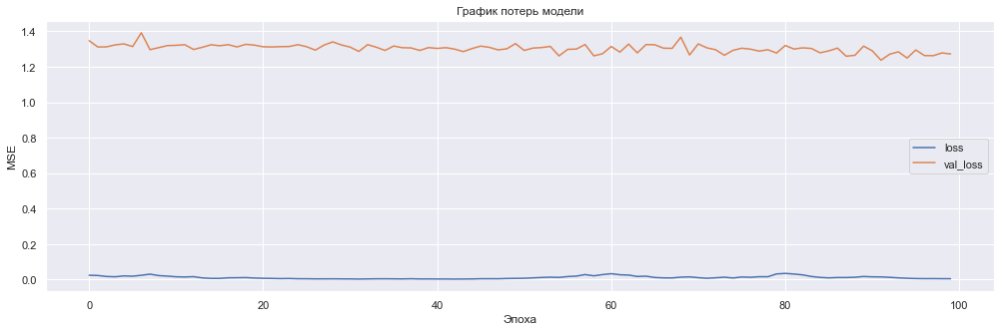

In [125]:
def model_loss_plot(model_hist):
    plt.figure(figsize=(17,5))
    plt.plot(model_hist.history['loss'])
    plt.plot(model_hist.history['val_loss'])
    plt.title('График потерь модели')
    plt.ylabel('MSE')
    plt.xlabel('Эпоха')
    plt.legend(['loss', 'val_loss'], loc='best')
    plt.show()
model_loss_plot(model_hist)

## Визуализация

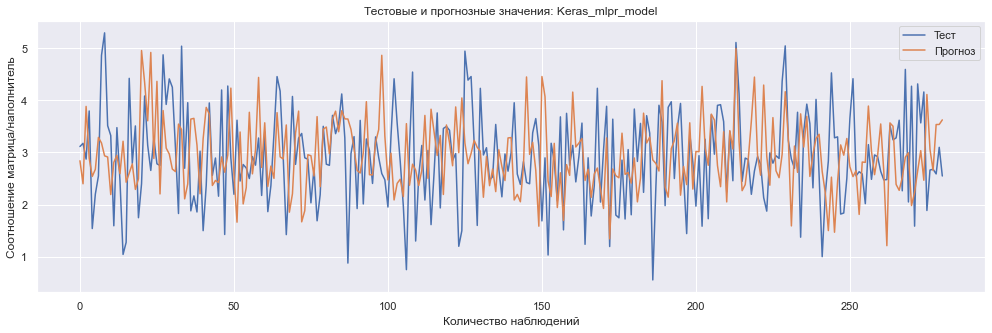

In [118]:
actual_and_predicted_plot(y_test.values, model.predict(x_test.values), 'Cоотношение матрица/наполнитель', 'Keras_mlpr_model')

## Величина оценки  MSE

In [126]:
model.evaluate(x_test, y_test, verbose=1)

9/9 [==============================] - 0s 2ms/step - loss: 1.1981


1.1981189250946045

##  Покажем датасет с ошибками модели

In [120]:
MSE = mean_squared_error(y_test, model.predict(x_test.values))
R2 = r2_score(y_test, model.predict(x_test.values))

keras_mlpr_model_errors = pd.DataFrame({'model_name':'Keras_mlpr_model',\
                                    'target_var':['Соотношение матрица/наполнитель'],\
                                    'MSE':[MSE],\
                                    'R2':[R2]})
df_errors = pd.concat([df_errors, keras_mlpr_model_errors], ignore_index=True)
df_errors

,target_var,model_name,MSE,R2
0,"Модуль упругости при растяжении, ГПа",LinearRegression,0.02798,-0.027603
1,"Прочность при растяжении, МПа",LinearRegression,0.028816,-0.011552
2,"Модуль упругости при растяжении, ГПа",KNeighborsRegressor,0.02771,-0.017687
3,"Прочность при растяжении, МПа",KNeighborsRegressor,0.02899,-0.017683
4,"Модуль упругости при растяжении, ГПа",RandomForestRegressor,0.027618,-0.014302
5,"Прочность при растяжении, МПа",RandomForestRegressor,0.028608,-0.004257
6,"Модуль упругости при растяжении, ГПа",MLPRegressor,0.027748,-0.019085
7,"Прочность при растяжении, МПа",MLPRegressor,0.02851,-0.000818
8,"Модуль упругости при растяжении, ГПа",lasso_model,0.027704,-0.017458
9,"Прочность при растяжении, МПа",lasso_model,0.028513,-0.000928


## Для веб-приложения во фреймворке Flask сохраняю модель

In [128]:
model.save('App/saved/keras')

INFO:tensorflow:Assets written to: App/saved/keras/assets
